In [155]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [156]:
%pwd

'c:\\Users\\Lenovo\\MLOPS\\DS-Intern-Assignment\\research'

In [157]:
df = pd.read_csv('../data/data.csv')
df.head()

,timestamp,equipment_energy_consumption,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone2_humidity,zone3_temperature,zone3_humidity,zone4_temperature,...,zone9_temperature,zone9_humidity,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,visibility_index,dew_point,random_variable1,random_variable2
0,2016-01-11 17:00:00,60.0,-77.78778596503064,33.74660933896648,47.59666666666671,19.2,44.790000,19.79,NaN,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.300000,13.275433,13.275433
1,2016-01-11 17:10:00,60.0,30.0,19.89,46.69333333333329,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.200000,18.606195,18.606195
2,2016-01-11 17:20:00,50.0,30.0,19.89,46.3,19.2,44.626667,19.79,44.933333,35.921144,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.100000,28.642668,28.642668
3,2016-01-11 17:30:00,50.0,40.0,33.74660933896648,46.0666666666667,19.2,44.590000,19.79,45.000000,NaN,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,37.673716,45.410389,45.410389
4,2016-01-11 17:40:00,60.0,40.0,19.89,46.33333333333329,19.2,44.530000,19.79,45.000000,18.890000,...,4.476511,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.900000,10.084097,10.084097


In [158]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16857 entries, 0 to 16856
Data columns (total 29 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   timestamp                     16857 non-null  object 
 1   equipment_energy_consumption  16013 non-null  object 
 2   lighting_energy               16048 non-null  object 
 3   zone1_temperature             15990 non-null  object 
 4   zone1_humidity                16056 non-null  object 
 5   zone2_temperature             16004 non-null  object 
 6   zone2_humidity                15990 non-null  float64
 7   zone3_temperature             16055 non-null  float64
 8   zone3_humidity                15979 non-null  float64
 9   zone4_temperature             16041 non-null  float64
 10  zone4_humidity                16076 non-null  float64
 11  zone5_temperature             16019 non-null  float64
 12  zone5_humidity                16056 non-null  float64
 13  z

In [159]:
df.shape

(16857, 29)

In [160]:
df.duplicated().sum()

np.int64(68)

In [161]:
df = df.drop_duplicates()
df.shape

(16789, 29)

In [162]:
df.isnull().sum()

timestamp                         0
equipment_energy_consumption    841
lighting_energy                 806
zone1_temperature               862
zone1_humidity                  799
zone2_temperature               848
zone2_humidity                  863
zone3_temperature               798
zone3_humidity                  877
zone4_temperature               811
zone4_humidity                  775
zone5_temperature               832
zone5_humidity                  797
zone6_temperature               842
zone6_humidity                  841
zone7_temperature               787
zone7_humidity                  800
zone8_temperature               843
zone8_humidity                  776
zone9_temperature               771
zone9_humidity                  886
outdoor_temperature             802
atmospheric_pressure            841
outdoor_humidity                794
wind_speed                      822
visibility_index                809
dew_point                       823
random_variable1            

In [163]:
### percentage of data missing
(df.isnull().sum()/len(df))*100

timestamp                       0.000000
equipment_energy_consumption    5.009232
lighting_energy                 4.800762
zone1_temperature               5.134314
zone1_humidity                  4.759068
zone2_temperature               5.050926
zone2_humidity                  5.140270
zone3_temperature               4.753112
zone3_humidity                  5.223658
zone4_temperature               4.830544
zone4_humidity                  4.616118
zone5_temperature               4.955626
zone5_humidity                  4.747156
zone6_temperature               5.015189
zone6_humidity                  5.009232
zone7_temperature               4.687593
zone7_humidity                  4.765025
zone8_temperature               5.021145
zone8_humidity                  4.622074
zone9_temperature               4.592293
zone9_humidity                  5.277265
outdoor_temperature             4.776937
atmospheric_pressure            5.009232
outdoor_humidity                4.729287
wind_speed      

In [164]:
df = df.dropna(subset=['equipment_energy_consumption'])

### since data is missing less than 5% in `equipment_energy_consumption`  so we have to remove these and then handle the missing data is best approach

In [165]:
df['timestamp'] = pd.to_datetime(df['timestamp'])

In [166]:
df['hour']   = df['timestamp'].dt.hour
df['minute'] = df['timestamp'].dt.minute

In [167]:
df.head()

,timestamp,equipment_energy_consumption,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone2_humidity,zone3_temperature,zone3_humidity,zone4_temperature,...,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,visibility_index,dew_point,random_variable1,random_variable2,hour,minute
0,2016-01-11 17:00:00,60.0,-77.78778596503064,33.74660933896648,47.59666666666671,19.2,44.790000,19.79,NaN,19.000000,...,6.600000,733.5,92.0,7.000000,63.000000,5.300000,13.275433,13.275433,17,0
1,2016-01-11 17:10:00,60.0,30.0,19.89,46.69333333333329,19.2,44.722500,19.79,44.790000,19.000000,...,6.483333,733.6,92.0,6.666667,59.166667,5.200000,18.606195,18.606195,17,10
2,2016-01-11 17:20:00,50.0,30.0,19.89,46.3,19.2,44.626667,19.79,44.933333,35.921144,...,6.366667,733.7,92.0,6.333333,55.333333,5.100000,28.642668,28.642668,17,20
3,2016-01-11 17:30:00,50.0,40.0,33.74660933896648,46.0666666666667,19.2,44.590000,19.79,45.000000,NaN,...,6.250000,733.8,92.0,6.000000,51.500000,37.673716,45.410389,45.410389,17,30
4,2016-01-11 17:40:00,60.0,40.0,19.89,46.33333333333329,19.2,44.530000,19.79,45.000000,18.890000,...,6.133333,733.9,92.0,5.666667,47.666667,4.900000,10.084097,10.084097,17,40


In [168]:

df = df.drop(columns=['timestamp'])

In [169]:
num_cols = [
    'equipment_energy_consumption',
    'lighting_energy',
    'zone1_temperature',
    'zone1_humidity',
    'zone2_temperature'
]

df[num_cols] = df[num_cols].apply(
    lambda col: pd.to_numeric(col, errors="coerce")
)

In [170]:
df.sample(5)

,equipment_energy_consumption,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone2_humidity,zone3_temperature,zone3_humidity,zone4_temperature,zone4_humidity,...,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,visibility_index,dew_point,random_variable1,random_variable2,hour,minute
14867,90.0,0.0,22.426667,39.100000,2.988199,35.460000,6.543921,36.90,22.50,34.700000,...,8.500000,757.000000,61.000000,5.000000,40.000000,1.350000,25.672924,25.672924,12,30
2316,30.0,0.0,19.500000,46.090000,36.552882,46.090000,19.890000,45.29,18.39,47.500000,...,10.400000,754.966667,86.000000,9.000000,28.666667,8.066667,20.298665,20.298665,17,40
9317,20.0,0.0,20.890000,40.790000,17.700000,46.966667,20.856667,38.26,NaN,35.790000,...,4.433333,764.366667,88.000000,4.000000,56.666667,2.633333,22.349576,22.349576,3,40
4031,80.0,20.0,21.290000,44.566667,20.390000,NaN,24.033333,43.36,21.26,43.400000,...,7.933333,739.733333,69.666667,10.333333,30.666667,2.600000,20.879190,NaN,14,40
11005,70.0,0.0,22.500000,37.663333,20.290000,40.656667,22.790000,37.20,20.70,39.466667,...,8.800000,750.100000,72.500000,6.500000,40.000000,4.100000,22.460082,22.460082,20,30


#### filling missing value

In [171]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5)
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

In [172]:
df_imputed.isnull().sum()

equipment_energy_consumption    0
lighting_energy                 0
zone1_temperature               0
zone1_humidity                  0
zone2_temperature               0
zone2_humidity                  0
zone3_temperature               0
zone3_humidity                  0
zone4_temperature               0
zone4_humidity                  0
zone5_temperature               0
zone5_humidity                  0
zone6_temperature               0
zone6_humidity                  0
zone7_temperature               0
zone7_humidity                  0
zone8_temperature               0
zone8_humidity                  0
zone9_temperature               0
zone9_humidity                  0
outdoor_temperature             0
atmospheric_pressure            0
outdoor_humidity                0
wind_speed                      0
visibility_index                0
dew_point                       0
random_variable1                0
random_variable2                0
hour                            0
minute        

In [173]:
df_imputed.head(5)

,equipment_energy_consumption,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone2_humidity,zone3_temperature,zone3_humidity,zone4_temperature,zone4_humidity,...,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,visibility_index,dew_point,random_variable1,random_variable2,hour,minute
0,60.0,-77.787786,33.746609,47.596667,19.2,44.790000,19.79,42.678667,19.000000,45.566667,...,6.600000,733.5,92.0,7.000000,63.000000,5.300000,13.275433,13.275433,17.0,0.0
1,60.0,30.000000,19.890000,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,6.483333,733.6,92.0,6.666667,59.166667,5.200000,18.606195,18.606195,17.0,10.0
2,50.0,30.000000,19.890000,46.300000,19.2,44.626667,19.79,44.933333,35.921144,45.890000,...,6.366667,733.7,92.0,6.333333,55.333333,5.100000,28.642668,28.642668,17.0,20.0
3,50.0,40.000000,33.746609,46.066667,19.2,44.590000,19.79,45.000000,20.880667,45.723333,...,6.250000,733.8,92.0,6.000000,51.500000,37.673716,45.410389,45.410389,17.0,30.0
4,60.0,40.000000,19.890000,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,6.133333,733.9,92.0,5.666667,47.666667,4.900000,10.084097,10.084097,17.0,40.0


In [176]:
df_sample = df.copy
num_vars = len(df.columns)

cell_height = 4   
cell_aspect = 1   

sns.set(style="ticks", context="notebook")
pair_grid = sns.pairplot(
    df,
    corner=False,
    diag_kind="hist",
    plot_kws={"alpha": 0.5, "s": 20, "edgecolor": None},
    height=cell_height,
    aspect=cell_aspect
)
pair_grid.fig.suptitle("Pairwise Scatter Plots & Diagonals", y=1.02)

plt.show()


In [96]:
corr = df.corr()
corr_target = corr['equipment_energy_consumption'].drop('equipment_energy_consumption').to_frame().T
corr

,equipment_energy_consumption,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone2_humidity,zone3_temperature,zone3_humidity,zone4_temperature,zone4_humidity,...,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,visibility_index,dew_point,random_variable1,random_variable2,hour,minute
equipment_energy_consumption,1.000000,0.057596,0.019071,0.026746,0.041355,-0.004135,0.038552,0.006857,0.017564,-0.003573,...,0.033186,-0.014114,-0.039317,0.011430,0.000730,-0.001070,-0.016552,-0.011765,0.120998,0.004585
lighting_energy,0.057596,1.000000,0.022413,0.045782,0.021726,0.017395,-0.010354,0.025049,0.032325,0.023961,...,0.004398,0.001014,0.014854,0.007506,0.003779,0.010602,0.004540,-0.002460,0.138800,-0.008272
zone1_temperature,0.019071,0.022413,1.000000,-0.010322,0.236028,-0.035576,0.253378,-0.013052,0.227234,-0.017233,...,0.159906,-0.027294,-0.086318,0.009164,-0.021355,0.098081,-0.004004,-0.004437,0.135770,0.011831
zone1_humidity,0.026746,0.045782,-0.010322,1.000000,0.032866,0.092983,0.003426,0.087912,-0.037195,0.126480,...,0.044109,-0.054727,0.049490,0.062504,-0.008716,0.111403,-0.016435,-0.007213,0.020267,-0.002086
zone2_temperature,0.041355,0.021726,0.236028,0.032866,1.000000,-0.055508,0.178929,0.033137,0.176873,0.032260,...,0.218334,-0.024363,-0.142173,0.064995,-0.022755,0.121745,0.004997,-0.014689,0.183856,0.000916
zone2_humidity,-0.004135,0.017395,-0.035576,0.092983,-0.055508,1.000000,0.011247,0.057943,-0.039063,0.106884,...,0.005352,-0.041084,0.096800,0.018974,-0.015111,0.108147,-0.007381,-0.005668,-0.069546,-0.003397
zone3_temperature,0.038552,-0.010354,0.253378,0.003426,0.178929,0.011247,1.000000,-0.041311,0.227319,-0.015217,...,0.173047,-0.046485,-0.067598,0.012601,-0.032056,0.131634,-0.012485,-0.000018,0.037668,-0.001986
zone3_humidity,0.006857,0.025049,-0.013052,0.087912,0.033137,0.057943,-0.041311,1.000000,-0.059230,0.094556,...,0.001551,-0.020593,0.036689,0.051326,-0.001243,0.076354,-0.004445,0.006379,-0.010506,0.015957
zone4_temperature,0.017564,0.032325,0.227234,-0.037195,0.176873,-0.039063,0.227319,-0.059230,1.000000,-0.059909,...,0.146028,0.000142,-0.110684,-0.026723,-0.036714,0.082837,0.002338,0.000058,0.066943,0.000762
zone4_humidity,-0.003573,0.023961,-0.017233,0.126480,0.032260,0.106884,-0.015217,0.094556,-0.059909,1.000000,...,0.039873,-0.033845,0.074696,0.085605,-0.001048,0.116192,-0.000320,0.004091,-0.020084,-0.000769


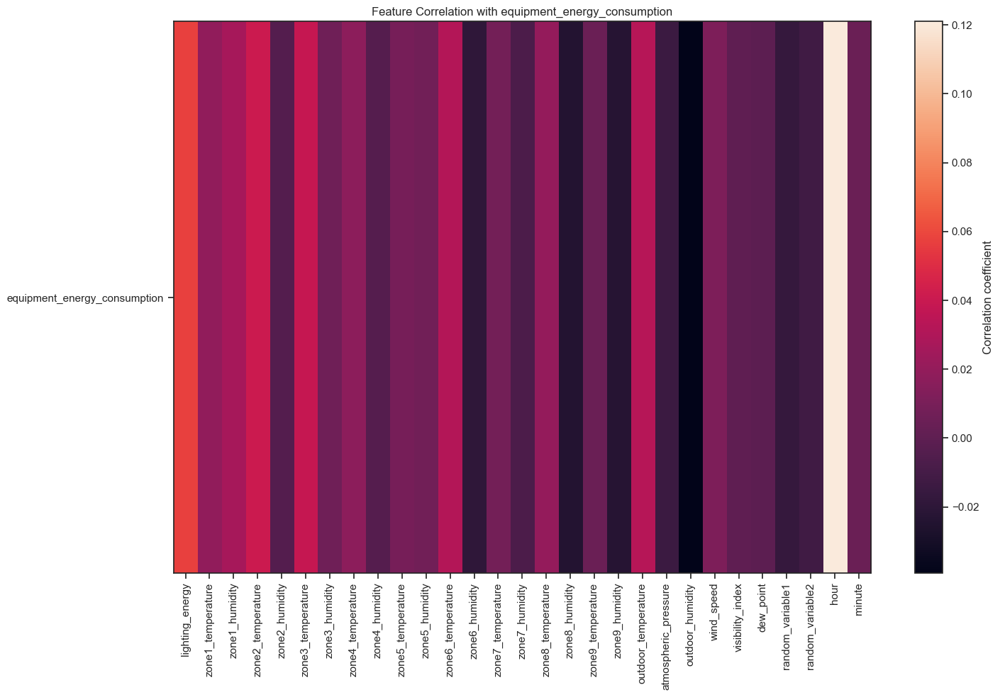

In [98]:
plt.figure(figsize=(15,10))
plt.imshow(corr_target, aspect='auto')
plt.colorbar(label='Correlation coefficient')
plt.xticks(range(len(corr_target.columns)), corr_target.columns, rotation=90)
plt.yticks([0], ['equipment_energy_consumption'])
plt.title('Feature Correlation with equipment_energy_consumption')
plt.tight_layout()
plt.show()

In [108]:
corr_with_target = df.corr()['equipment_energy_consumption'].drop('equipment_energy_consumption')

min_corr =0.01
keep = corr_with_target[ corr_with_target.abs() >= min_corr ].index.tolist()
drop = corr_with_target[ corr_with_target.abs() <  min_corr ].index.tolist()

In [109]:
print('important column ', keep)
print('\n')
print('Useless column ', drop)

important column  ['lighting_energy', 'zone1_temperature', 'zone1_humidity', 'zone2_temperature', 'zone3_temperature', 'zone4_temperature', 'zone6_temperature', 'zone6_humidity', 'zone8_temperature', 'zone8_humidity', 'zone9_humidity', 'outdoor_temperature', 'atmospheric_pressure', 'outdoor_humidity', 'wind_speed', 'random_variable1', 'random_variable2', 'hour']


Useless column  ['zone2_humidity', 'zone3_humidity', 'zone4_humidity', 'zone5_temperature', 'zone5_humidity', 'zone7_temperature', 'zone7_humidity', 'zone9_temperature', 'visibility_index', 'dew_point', 'minute']


#### Box plot

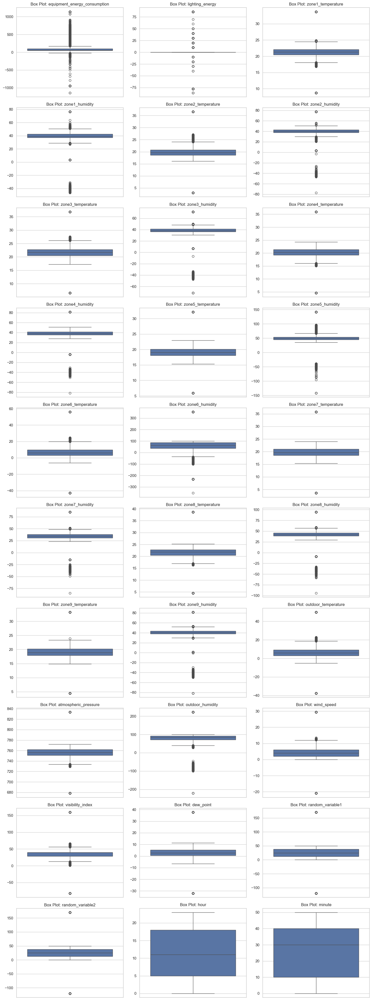

In [85]:
num_cols = df.select_dtypes(include=["float64", "int32", "int64"]).columns
n = len(num_cols)
cols = 3  # number of plots per row
rows = (n + cols - 1) // cols

plt.figure(figsize=(cols * 5, rows * 4))
sns.set(style="whitegrid")

for i, col in enumerate(num_cols, 1):
    ax = plt.subplot(rows, cols, i)
    sns.boxplot(y=df[col], ax=ax)
    ax.set_title(f"Box Plot: {col}")
    ax.set_ylabel("")  # remove redundant ylabel

plt.tight_layout()
plt.show()

### kde plot

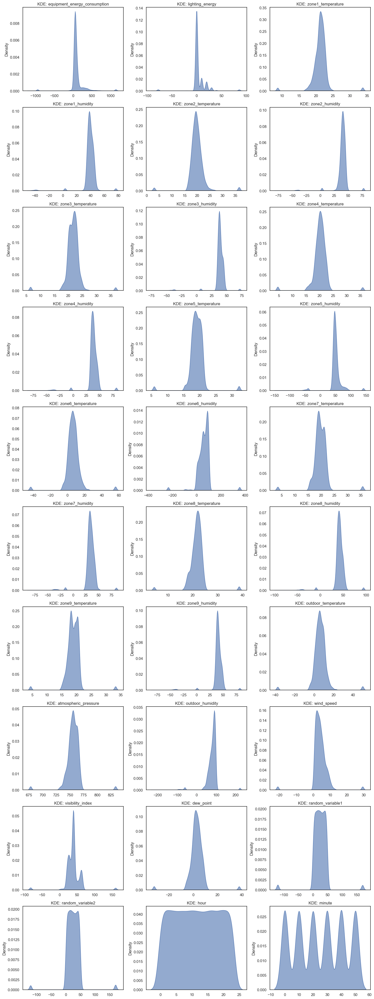

In [86]:
plt.figure(figsize=(cols * 5, rows * 4))
sns.set(style="white")

for i, col in enumerate(num_cols, 1):
    ax = plt.subplot(rows, cols, i)
    sns.kdeplot(
        data=df[col].dropna(),
        fill=True,
        common_norm=False,
        bw_adjust=1,
        alpha=0.6,
        ax=ax
    )
    ax.set_title(f"KDE: {col}")
    ax.set_xlabel("")  # optional

plt.tight_layout()
plt.show()

In [89]:
from sklearn.feature_selection import VarianceThreshold
vt = VarianceThreshold(threshold=0.0)
vt.fit(df)
keep_mask = vt.get_support()
cols_after_vt = df.columns[keep_mask]

In [90]:
cols_after_vt

Index(['equipment_energy_consumption', 'lighting_energy', 'zone1_temperature',
       'zone1_humidity', 'zone2_temperature', 'zone2_humidity',
       'zone3_temperature', 'zone3_humidity', 'zone4_temperature',
       'zone4_humidity', 'zone5_temperature', 'zone5_humidity',
       'zone6_temperature', 'zone6_humidity', 'zone7_temperature',
       'zone7_humidity', 'zone8_temperature', 'zone8_humidity',
       'zone9_temperature', 'zone9_humidity', 'outdoor_temperature',
       'atmospheric_pressure', 'outdoor_humidity', 'wind_speed',
       'visibility_index', 'dew_point', 'random_variable1', 'random_variable2',
       'hour', 'minute'],
      dtype='object')

In [95]:
corr = df.corr().abs()

# 2) take the upper triangle (exclude the diagonal)
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))

# 3) any column with at least one correlation > 0.90 gets dropped
to_drop = [col for col in upper.columns if any(upper[col] > 0.50)]

# 4) inspect them
print("Dropping highly-correlated columns:", to_drop)

Dropping highly-correlated columns: []


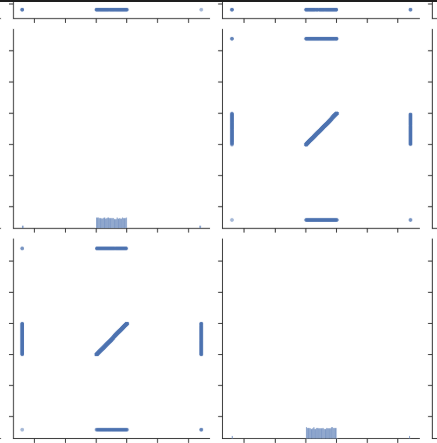

## Some insights from EDA and feature enginnering
- all columns are normalized
- outliers are present in the column's
- random_variable are nearly same ( upper graph) so we take the average of both and make a new column also it is important for prediction
- Finding no columns even at a 0.50 correlation cutoff tells you something important:
    1. predictors are pretty independent
    2. need to drop for multicollinearity
- drop columns which have less dependency on target column are ['zone2_humidity', 'zone3_humidity', 'zone4_humidity', 'zone5_temperature', 'zone5_humidity', 'zone7_temperature', 'zone7_humidity', 'zone9_temperature', 'visibility_index', 'dew_point', 'minute'] beacuse the threshold is less than 0.01 

In [177]:
df_imputed['random_variable'] = (df_imputed['random_variable1'] + df_imputed['random_variable2'])/2

In [178]:
df_imputed = df_imputed.drop(columns=drop)
df_imputed = df_imputed.drop(columns=['random_variable1', 'random_variable2'])

In [179]:
df_imputed.shape

(15948, 18)

In [180]:
df_imputed.head()

,equipment_energy_consumption,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone3_temperature,zone4_temperature,zone6_temperature,zone6_humidity,zone8_temperature,zone8_humidity,zone9_humidity,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,hour,random_variable
0,60.0,-77.787786,33.746609,47.596667,19.2,19.79,19.000000,5.622000,84.256667,18.2,48.900000,45.53,6.600000,733.5,92.0,7.000000,17.0,13.275433
1,60.0,30.000000,19.890000,46.693333,19.2,19.79,19.000000,6.833333,84.063333,18.2,48.863333,45.56,6.483333,733.6,92.0,6.666667,17.0,18.606195
2,50.0,30.000000,19.890000,46.300000,19.2,19.79,35.921144,6.560000,83.156667,18.2,48.730000,45.50,6.366667,733.7,92.0,6.333333,17.0,28.642668
3,50.0,40.000000,33.746609,46.066667,19.2,19.79,20.880667,6.433333,83.423333,18.1,94.385668,45.40,6.250000,733.8,92.0,6.000000,17.0,45.410389
4,60.0,40.000000,19.890000,46.333333,19.2,19.79,18.890000,6.366667,84.893333,18.1,48.590000,45.40,6.133333,733.9,92.0,5.666667,17.0,10.084097


#### since our column's are numerical so we have to handle the outliers

In [181]:
def clamp_outliers(df: pd.DataFrame) -> pd.DataFrame:
    """
    Winsorize numeric columns so that any values below
    Q1 - 1.5*IQR become exactly Q1 - 1.5*IQR, and likewise
    for values above Q3 + 1.5*IQR.
    """
    df_clamped = df.copy()
    num_cols = df_clamped.select_dtypes(include="number").columns

    for col in num_cols:
        Q1, Q3 = df_clamped[col].quantile([0.25, 0.75])
        IQR = Q3 - Q1
        lower, upper = Q1 - 1.5*IQR, Q3 + 1.5*IQR

        df_clamped[col] = df_clamped[col].clip(lower=lower, upper=upper)

    return df_clamped

In [182]:
df_imputed = clamp_outliers(df_imputed)
df_imputed.head()

,equipment_energy_consumption,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone3_temperature,zone4_temperature,zone6_temperature,zone6_humidity,zone8_temperature,zone8_humidity,zone9_humidity,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,hour,random_variable
0,60.0,-6.0,24.45,47.596667,19.2,19.79,19.000000,5.622000,84.256667,18.2,48.900000,45.53,6.600000,734.45,92.0,7.000000,17.0,13.275433
1,60.0,10.0,19.89,46.693333,19.2,19.79,19.000000,6.833333,84.063333,18.2,48.863333,45.56,6.483333,734.45,92.0,6.666667,17.0,18.606195
2,50.0,10.0,19.89,46.300000,19.2,19.79,24.460000,6.560000,83.156667,18.2,48.730000,45.50,6.366667,734.45,92.0,6.333333,17.0,28.642668
3,50.0,10.0,24.45,46.066667,19.2,19.79,20.880667,6.433333,83.423333,18.1,56.901333,45.40,6.250000,734.45,92.0,6.000000,17.0,45.410389
4,60.0,10.0,19.89,46.333333,19.2,19.79,18.890000,6.366667,84.893333,18.1,48.590000,45.40,6.133333,734.45,92.0,5.666667,17.0,10.084097


In [183]:
df_imputed.shape

(15948, 18)

In [184]:
df_imputed.isnull().sum()

equipment_energy_consumption    0
lighting_energy                 0
zone1_temperature               0
zone1_humidity                  0
zone2_temperature               0
zone3_temperature               0
zone4_temperature               0
zone6_temperature               0
zone6_humidity                  0
zone8_temperature               0
zone8_humidity                  0
zone9_humidity                  0
outdoor_temperature             0
atmospheric_pressure            0
outdoor_humidity                0
wind_speed                      0
hour                            0
random_variable                 0
dtype: int64

## Model selection

In [188]:
y = df_imputed['equipment_energy_consumption']
X = df_imputed.drop(columns=['equipment_energy_consumption'])

In [189]:
from sklearn.model_selection import train_test_split
X_train , X_test, y_train , y_test = train_test_split(X , y , test_size = 0.2 , random_state=42)
X_train.shape, y_train.shape , X_test.shape , y_test.shape

((12758, 17), (12758,), (3190, 17), (3190,))

In [203]:
X_train.head()

,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone3_temperature,zone4_temperature,zone6_temperature,zone6_humidity,zone8_temperature,zone8_humidity,zone9_humidity,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,hour,random_variable
6688,0.00,21.70,33.80,19.60,22.13,19.79,6.50,24.07,22.93,30.60,38.40,6.10,762.33,45.67,5.33,15.00,27.20
1665,0.00,19.10,43.73,18.76,17.79,16.14,5.76,99.90,19.05,49.49,44.70,-6.22,770.23,90.33,5.00,21.00,41.01
4600,10.00,20.20,40.90,18.39,21.00,19.43,4.09,92.30,20.88,44.39,43.19,2.53,735.88,96.67,1.17,9.00,14.62
9620,0.00,21.79,37.40,19.17,22.26,21.26,5.93,61.07,22.03,43.83,40.00,5.50,758.90,87.00,2.00,3.00,36.66
2582,0.00,20.29,45.06,19.96,20.00,19.30,6.76,18.45,19.52,51.87,47.29,6.48,751.75,94.17,4.83,14.00,22.81


In [202]:
import os
os.makedirs("data", exist_ok=True)
X_train.to_csv("data/X_train.csv", index=False)
X_test .to_csv("data/X_test.csv",  index=False)
y_train.to_csv("data/y_train.csv", index=False, header=True)
y_test .to_csv("data/y_test.csv",  index=False, header=True)

In [190]:
!pip install lazypredict

   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ------------------------------------ --- 1.3/1.5 MB 9.6 MB/s eta 0:00:01
   ---------------------------------------- 1.5/1.5 MB 8.4 MB/s eta 0:00:00
   ---------------------------------------- 0.0/150.0 MB ? eta -:--:--
   ---------------------------------------- 1.6/150.0 MB 7.7 MB/s eta 0:00:20
   - -------------------------------------- 3.9/150.0 MB 9.4 MB/s eta 0:00:16
   - -------------------------------------- 6.3/150.0 MB 10.2 MB/s eta 0:00:15
   -- ------------------------------------- 8.9/150.0 MB 10.7 MB/s eta 0:00:14
   --- ------------------------------------ 11.3/150.0 MB 10.8 MB/s eta 0:00:13
   --- ------------------------------------ 13.9/150.0 MB 11.0 MB/s eta 0:00:13
   ---- ----------------------------------- 16.5/150.0 MB 11.2 MB/s eta 0:00:12
   ----- ---------------------------------- 18.9/150.0 MB 11.2 MB/s eta 0:00:12
   ----- ---------------------------------- 21.5/150.0 MB 11.3 MB/s eta 0:

In [200]:
from lazypredict.Supervised import LazyRegressor
clf = LazyRegressor(verbose = 0 , ignore_warnings = True , custom_metric = None)

In [ ]:
models , prediction = clf.fit(X_train , X_test , y_train , y_test)

## since it required GPU so i trained it on Google Colab and getting the best model
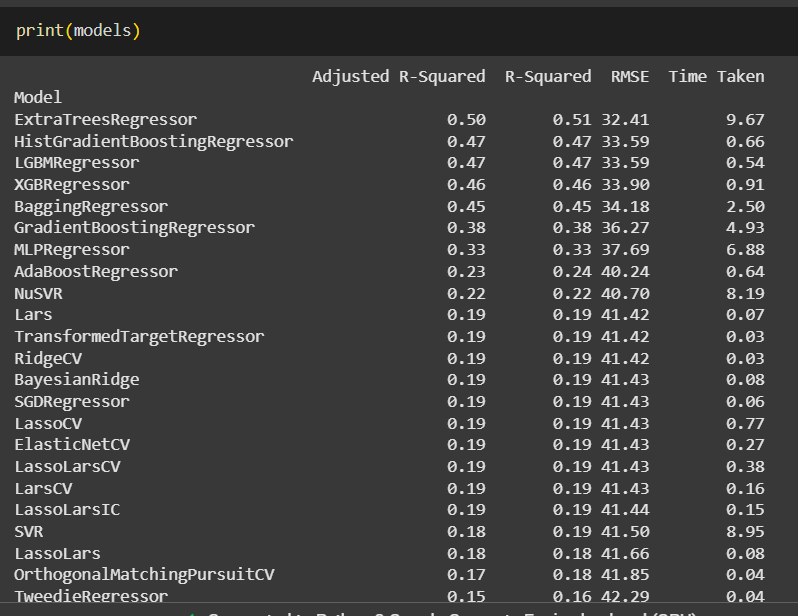